In [1]:
%load_ext autoreload
%autoreload 2


In [75]:
from ohsome_preprocess import get_overall_landuse_data, get_data_for_map, clean_data_for_map, get_map
from ohsome import OhsomeClient
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
client = OhsomeClient(log=False)

In [4]:
london_bbox = [-0.216408,51.469149,-0.058904,51.551072]
time = '2022-08-01'
filter = 'landuse=*'
properties = 'tags'

In [7]:
landuse_df = get_overall_landuse_data(bbox=london_bbox, time = '2022-08-01', filter= 'landuse=*')
landuse_df

value
boundary  tag                          timestamp                        
boundary1 landuse=allotments           2022-08-01 00:00:00+00:00    36.0
          landuse=animal_enclosure     2022-08-01 00:00:00+00:00    16.0
          landuse=brownfield           2022-08-01 00:00:00+00:00    40.0
          landuse=cemetery             2022-08-01 00:00:00+00:00    16.0
          landuse=churchyard           2022-08-01 00:00:00+00:00     7.0
          landuse=civic                2022-08-01 00:00:00+00:00     1.0
          landuse=commercial           2022-08-01 00:00:00+00:00   566.0
          landuse=construction         2022-08-01 00:00:00+00:00   368.0
          landuse=courtyard            2022-08-01 00:00:00+00:00     1.0
          landuse=dead_allotments      2022-08-01 00:00:00+00:00     1.0
          landuse=depot                2022-08-01 00:00:00+00:00     4.0
          landuse=education            2022-08-01 00:00:00+00:00     2.0
          landuse=farmland             2022-08-01 00:00:00+00:00     1.0
          landuse=farmyard             2022-08-01 00:00:00+00:00     5.0
          landuse=flowerbed            2022-08-01 00:00:00+00:00   117.0
          landuse=forest               2022-08-01 00:00:00+00:00    11.0
          landuse=garages              2022-08-01 00:00:00+00:00     6.0
          landuse=governmental         2022-08-01 00:00:00+00:00     6.0
          landuse=grass                2022-08-01 00:00:00+00:00  1644.0
          landuse=graveyard            2022-08-01 00:00:00+00:00     1.0
          landuse=green                2022-08-01 00:00:00+00:00     1.0
          landuse=hospitality          2022-08-01 00:00:00+00:00    27.0
          landuse=industrial           2022-08-01 00:00:00+00:00   155.0
          landuse=leisure              2022-08-01 00:00:00+00:00     1.0
          landuse=meadow               2022-08-01 00:00:00+00:00    14.0
          landuse=military             2022-08-01 00:00:00+00:00    13.0
          landuse=mixed                2022-08-01 00:00:00+00:00     1.0
          landuse=orchard              2022-08-01 00:00:00+00:00     3.0
          landuse=planned:construction 2022-08-01 00:00:00+00:00     1.0
          landuse=plant_nursery        2022-08-01 00:00:00+00:00     7.0
          landuse=plaza                2022-08-01 00:00:00+00:00     2.0
          landuse=railway              2022-08-01 00:00:00+00:00   259.0
          landuse=recreation_ground    2022-08-01 00:00:00+00:00    49.0
          landuse=religious            2022-08-01 00:00:00+00:00   113.0
          landuse=residential          2022-08-01 00:00:00+00:00  2842.0
          landuse=retail               2022-08-01 00:00:00+00:00  1187.0
          landuse=road                 2022-08-01 00:00:00+00:00     1.0
          landuse=traffic_island       2022-08-01 00:00:00+00:00     2.0
          landuse=university           2022-08-01 00:00:00+00:00     1.0
          landuse=unknown              2022-08-01 00:00:00+00:00     1.0
          landuse=village_green        2022-08-01 00:00:00+00:00     5.0
          landuse=yard                 2022-08-01 00:00:00+00:00     1.0

In [8]:

response = client.elements.geometry.post(bboxes=london_bbox, time=time, filter= filter, properties=properties)

In [9]:
response_df = response.as_dataframe()
response_df.landuse.value_counts().count()

42

In [10]:
import matplotlib.pyplot as plt

<AxesSubplot: >

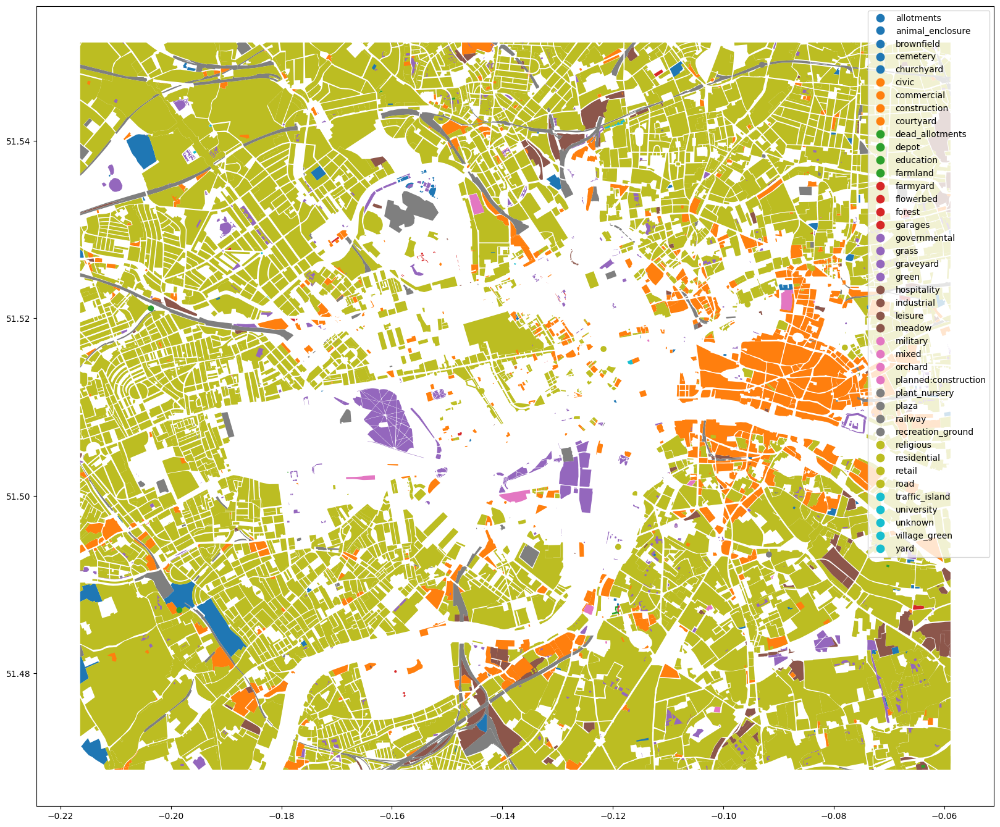

In [11]:
fig, ax = plt.subplots(1,1, figsize= (20,20))
response_df.plot(column = 'landuse',ax = ax, legend= True)

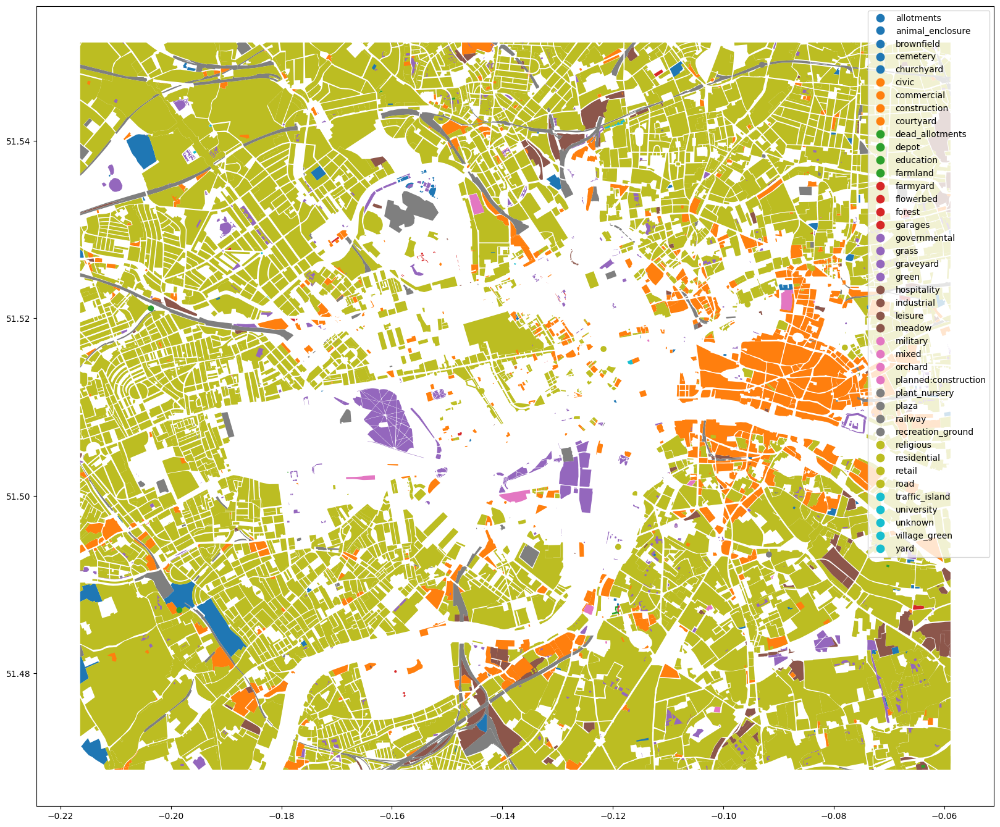

In [12]:
response_df, map = get_data_for_map(bbox= london_bbox, time= time, filter='landuse=*')

In [20]:
response_df = response_df.droplevel(1)

In [32]:
response_df.head()

,geometry,access,landuse,type,name,operator,place,construction,website,source,...,recycling:plastic_packaging,recycling:tyres,recycling:wood,works,demolished:addr:housenumber,demolished:addr:street,addr:place,opening_date,building:use,light_rail
@osmId,,,,,,,,,,,,,,,,,,,,,
node/1022389851,POINT (-0.07332 51.49185),NaN,residential,NaN,Longfield Estate,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
node/1022389854,POINT (-0.07016 51.48964),NaN,residential,NaN,Lynton Estate,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
node/1022389857,POINT (-0.07369 51.48784),NaN,residential,NaN,Astley Estate,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
node/1115243525,POINT (-0.11904 51.49426),NaN,residential,NaN,Whitgift Estate,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
node/1125067421,POINT (-0.07657 51.50082),NaN,residential,NaN,St John's Estate,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
((response_df.isna().sum())/len(response_df)).sort_values()

geometry          0.000000
landuse           0.000000
name              0.877107
source            0.930325
place             0.972528
                    ...   
disused:studio    0.999867
contact:phone     0.999867
user              0.999867
old_alt_name      0.999867
light_rail        0.999867
Length: 229, dtype: float64

In [33]:
response_cleaned = response_df[['geometry', 'landuse']]

<AxesSubplot: >

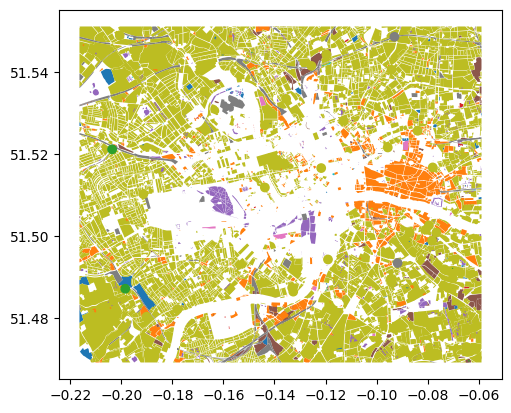

In [37]:
response_cleaned.plot(column = 'landuse')

<AxesSubplot: >

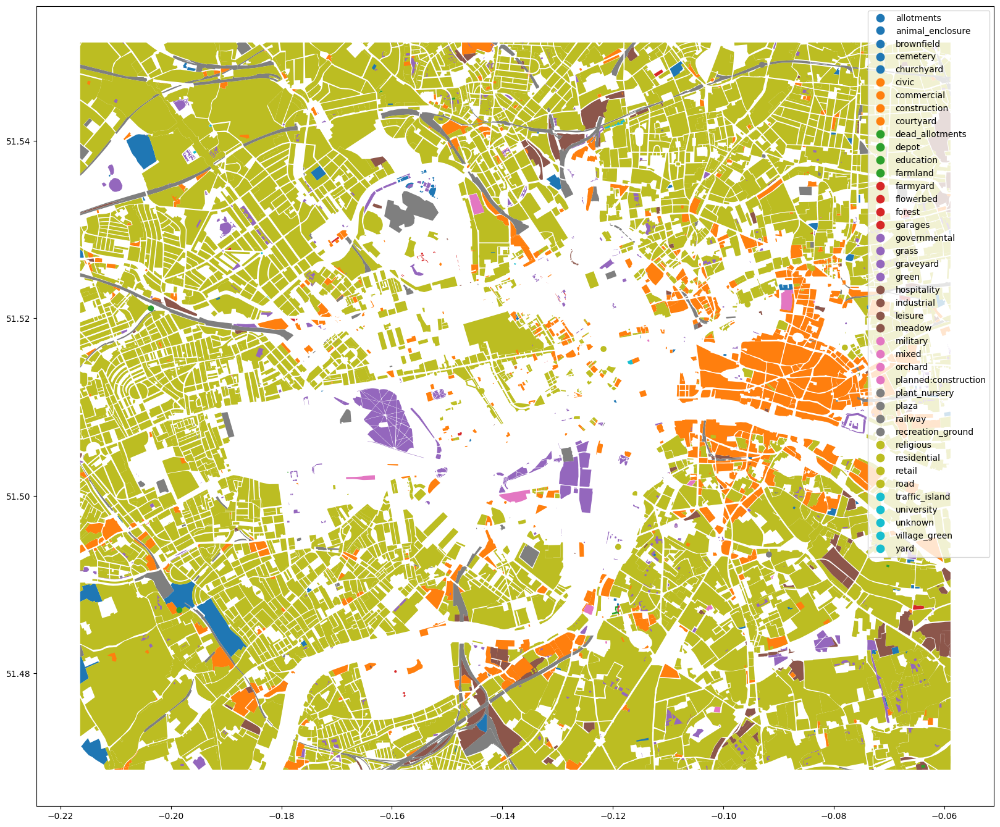

In [39]:
get_map(response_cleaned)

In [43]:
list(response_cleaned.landuse.unique())

['residential',
 'depot',
 'retail',
 'recreation_ground',
 'railway',
 'construction',
 'commercial',
 'grass',
 'industrial',
 'military',
 'flowerbed',
 'religious',
 'orchard',
 'forest',
 'allotments',
 'brownfield',
 'education',
 'road',
 'cemetery',
 'yard',
 'plant_nursery',
 'village_green',
 'leisure',
 'garages',
 'graveyard',
 'meadow',
 'churchyard',
 'farmyard',
 'traffic_island',
 'unknown',
 'animal_enclosure',
 'farmland',
 'plaza',
 'planned:construction',
 'green',
 'university',
 'courtyard',
 'governmental',
 'civic',
 'dead_allotments',
 'hospitality',
 'mixed']

In [ ]:
pd.DataFrame((1))

In [58]:
response_cleaned.loc[response_cleaned['landuse'].isin(['unknown', 'mixed'])]

,geometry,landuse
@osmId,,
way/370369101,"POLYGON ((-0.07362 51.54655, -0.07276 51.54652...",unknown
way/90153925,"POLYGON ((-0.10514 51.50156, -0.10507 51.50175...",mixed


In [61]:
indexes_to_drop = response_cleaned.index[response_cleaned['landuse'].isin(['unknown', 'mixed'])].tolist()
indexes_to_drop

['way/370369101', 'way/90153925']

In [92]:
response_cleaned = response_cleaned.drop(indexes_to_drop, axis=0, inplace = True).copy()

KeyError: "['way/370369101', 'way/90153925'] not found in axis"

In [70]:
response_cleaned.landuse.value_counts().count()

40

In [73]:
response_cleaned.landuse.value_counts()

residential             2842
grass                   1644
retail                  1187
commercial               566
construction             368
railway                  259
industrial               155
flowerbed                117
religious                113
recreation_ground         49
brownfield                40
allotments                36
hospitality               27
cemetery                  16
animal_enclosure          16
meadow                    14
military                  13
forest                    11
churchyard                 7
plant_nursery              7
governmental               6
garages                    6
village_green              5
farmyard                   5
depot                      4
orchard                    3
traffic_island             2
plaza                      2
education                  2
road                       1
farmland                   1
graveyard                  1
planned:construction       1
green                      1
university    

In [77]:
import contextily as ctx

In [79]:
w,s,e,n = [coord for coord in london_bbox]
w,s,e,n

(-0.216408, 51.469149, -0.058904, 51.551072)

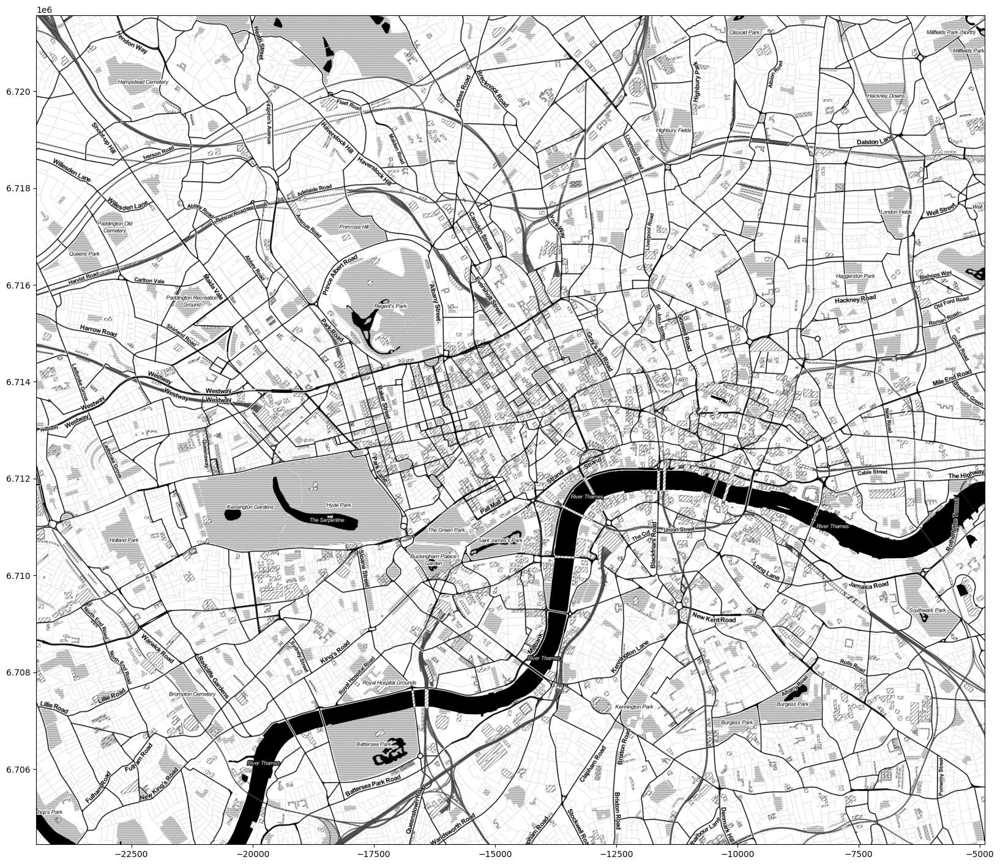

In [94]:
london_img, london_ext = ctx.bounds2img(w,s,e,n,
                                        ll=True,
                                        source = ctx.providers.Stamen.Toner)
fig, ax = plt.subplots(1,1, figsize = (20,20))
ax.imshow(london_img, extent=london_ext)

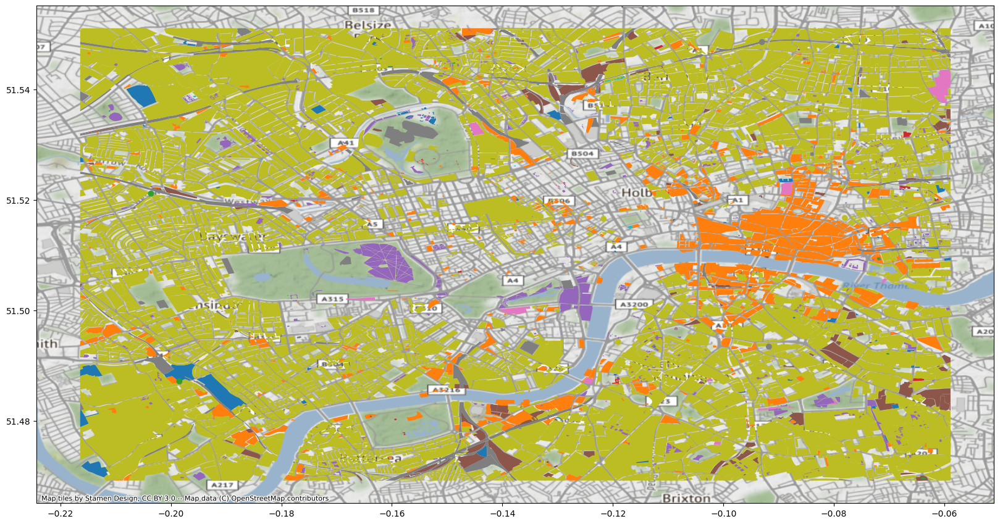

In [100]:
ax = response_cleaned.plot(column = 'landuse', figsize=(20,20))
ctx.add_basemap(ax, crs = response_cleaned.crs.to_string())

In [102]:
categories = {'open_areas': ['grass', 'flowerbed', 'recreation_ground', 'allotments', 
                             'animal_enclosure', 'meadow', 'forest', 'plant_nursery', 'village_green', 'farmyard',
                             'orchard', 'traffic_island', 'plaza', 'road', 'farmland', 'green', 'courtyard','leisure',
                             'dead_allotments', 'yard'], 
              'residential': ['residential', 'garages', 'farmyard'],
              'commercial': ['commercial', 'retail', 'hospitality'],
              'religious': ['religious', 'cemetery', 'churchyard', 'graveyard'],
              'industrial':['industrial', 'depot', 'railway', 'construction', 'planned:construction'],
              'brownfield': ['brownfield'],
              'institutional':['military', 'governmental', 'education', 'university', 'civic']
              }

In [110]:
categories = {}
for landuse in response_cleaned.landuse.value_counts().keys():
    if landuse == 'grass' or 'flowerbed' or 'recreation_ground':
        categories[landuse] == 'open_areas'
    elif landuse ==

residential
grass
retail
commercial
construction
railway
industrial
flowerbed
religious
recreation_ground
brownfield
allotments
hospitality
cemetery
animal_enclosure
meadow
military
forest
churchyard
plant_nursery
governmental
garages
village_green
farmyard
depot
orchard
traffic_island
plaza
education
road
farmland
graveyard
planned:construction
green
university
courtyard
leisure
civic
dead_allotments
yard


In [105]:
response_cleaned['categories'] = response_cleaned['landuse'].map(categories).copy()

/home/leah/.pyenv/versions/3.10.6/envs/future_proofing_cities/lib/python3.10/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)
